<a href="https://colab.research.google.com/github/PhaniKumarDytha/MovingBarChart/blob/master/Moving_Bar_chart.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [48]:
import pandas as pd
import datetime
import requests
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.offsetbox import OffsetImage,AnnotationBbox
import numpy as np

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [158]:
data=pd.read_csv("https://covid.ourworldindata.org/data/owid-covid-data.csv")

In [157]:
data.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,tests_per_case,positive_rate,tests_units,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,month,year,time_frame
35430,OWID_WRL,NaN,World,2019-12-31,27.0,27.0,0.0,0.0,0.003,0.003,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.794799e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,12,2019,2019-12
35431,OWID_WRL,NaN,World,2020-01-01,27.0,0.0,0.0,0.0,0.003,0.000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.794799e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,1,2020,2020-1
35432,OWID_WRL,NaN,World,2020-01-02,27.0,0.0,0.0,0.0,0.003,0.000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.794799e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,1,2020,2020-1
35433,OWID_WRL,NaN,World,2020-01-03,44.0,17.0,0.0,0.0,0.006,0.002,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.794799e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,1,2020,2020-1
35434,OWID_WRL,NaN,World,2020-01-04,44.0,0.0,0.0,0.0,0.006,0.000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.794799e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,1,2020,2020-1


In [195]:
data = data.loc[~data['location'].isin(['World','International'])]
data['month']=data['date'].apply(lambda x:datetime.datetime.strptime(x, "%Y-%m-%d").month)
data['year']=data['date'].apply(lambda x:datetime.datetime.strptime(x, "%Y-%m-%d").year)

In [197]:
#summary_data=data[['location','date','total_cases']].groupby(['location','date']).max().reset_index()
summary_data=data[['location','date','total_cases']].copy()
summary_data.reset_index(drop=True,inplace=True)

In [199]:
summary_data=summary_data[['location','date','total_cases']].pivot(index="location",columns="date",values="total_cases").reset_index()

In [200]:
summary_total_cases=summary_data.loc[:, summary_data.columns != 'location'].T.ffill().T.fillna(0)
summary_total_cases.set_index(summary_data['location'],inplace=True)
summary_total_cases.reset_index(inplace=True)

In [226]:
def get_flag(name):
    item="India"
    url = 'https://en.wikipedia.org/wiki/File:Flag_of_'+str(name)+'.svg'
    r = requests.get(url)
    soup = BeautifulSoup(r.text, 'lxml')
    flaglink= soup.find('span', {'class':'mw-filepage-other-resolutions'}).findAll('a')[3]['href']
    im= plt.imread('https:'+flaglink)
    return im

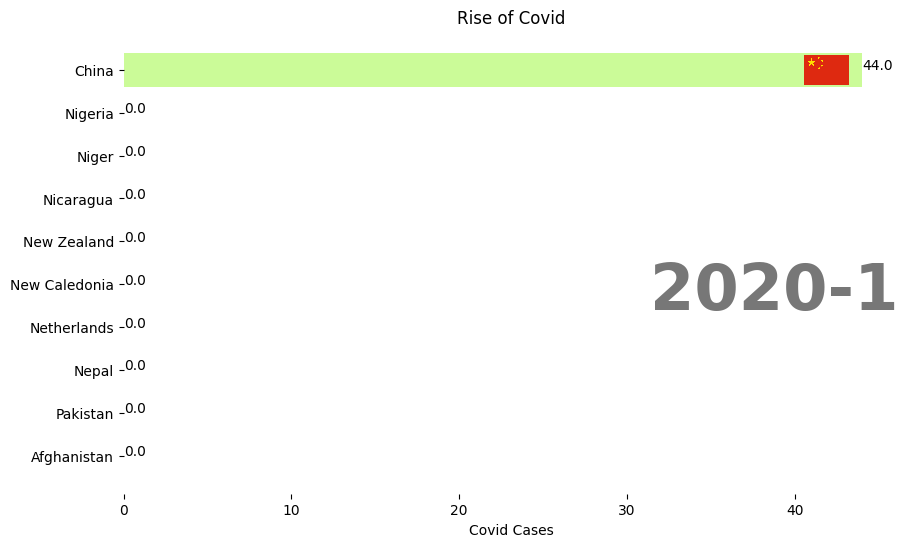

In [251]:
def animate(i):
  plt.rcdefaults()
  fig, ax = plt.subplots(figsize=(10, 6))
  ax.clear()
  pltdata=summary_total_cases.sort_values(by=summary_total_cases.columns[i],ascending=False)
  pltdata=pltdata.head(10)
  pltdata=pltdata.sort_values(by=summary_total_cases.columns[i],ascending=True)
  people = tuple(pltdata.index)
  y_pos = np.arange(len(people))
  performance = pltdata.iloc[:,:i]
  timeframe = str(datetime.datetime.strptime(pltdata.columns[i], "%Y-%m-%d").year)+'-'+str(datetime.datetime.strptime(pltdata.columns[i], "%Y-%m-%d").month)
  ax.barh(pltdata.iloc[:,0],pltdata.iloc[:,i],color="#CBFB98")
  dx = pltdata.iloc[:,i].max() / 200000
  for i, (value, name) in enumerate(zip(pltdata.iloc[:,i],pltdata.iloc[:,0])):
    ax.text(value-dx, i,     value,           size=10, weight=200, ha='left')
    img = get_flag(name)
    im = OffsetImage(img, zoom=0.025)
    im.image.axes = ax
    ab = AnnotationBbox(im, (value-(dx*10000), i),  xybox=(1, 0), frameon=False,
                            xycoords='data',  boxcoords="offset points", pad=0)
    ax.add_artist(ab)
  ax.text(1, 0.4, timeframe, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
  ax.set_xlabel('Covid Cases')
  ax.set_title('Rise of Covid')
  plt.box(False)



animate(5)    

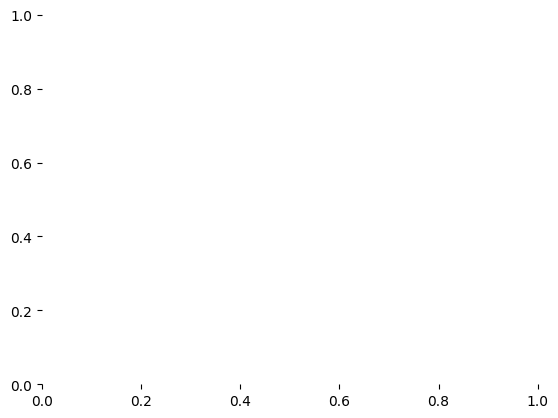

In [253]:
from IPython.display import HTML
anim = FuncAnimation(fig, animate,frames=range(1,len(summary_total_cases.columns)))
HTML(anim.to_jshtml())
#anim.save('data.mp4', writer='ffmpeg', fps=20)